In [4]:
# Install additional packages

# !pip install gTTS
# !pip install playsound

  Attempting uninstall: requests
    Found existing installation: requests 2.26.0
    Uninstalling requests-2.26.0:
      Successfully uninstalled requests-2.26.0
  Attempting uninstall: click
    Found existing installation: click 8.0.3
    Uninstalling click-8.0.3:
      Successfully uninstalled click-8.0.3


ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
conda-repo-cli 1.0.4 requires pathlib, which is not installed.
anaconda-project 0.10.1 requires ruamel-yaml, which is not installed.
streamlit 1.9.0 requires click<8.1,>=7.0, but you have click 8.1.3 which is incompatible.


  Created wheel for playsound: filename=playsound-1.3.0-py3-none-any.whl size=7037 sha256=a225a4f7e86c45dc05e87411f8ac144d8abcd99ed5296d3b83e7ff9f3faeb112
  Stored in directory: c:\users\win10\appdata\local\pip\cache\wheels\ba\39\54\c8f7ff9a88a644d3c58b4dec802d90b79a2e0fb2a6b884bf82
Successfully built playsound


In [5]:
import os
import pickle # storing numpy features
import numpy as np # basic
from tqdm.notebook import tqdm # estimation for progress, smart progress bar

# from tensorflow.keras.applications.mobilenet import MobileNet
# from tensorflow.keras.applications.resnet50 import ResNet50
from tensorflow.keras.applications.vgg16 import VGG16, preprocess_input # extracting feature from image data
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences # even out the sentence for remaining len
from tensorflow.keras.models import Model
from tensorflow.keras.utils import to_categorical, plot_model # for visualizing the model layers
from tensorflow.keras.layers import Input, Dense, LSTM, Embedding, Dropout, add
from keras.models import load_model

from PIL import Image
import matplotlib.pyplot as plt

from nltk.translate.bleu_score import corpus_bleu

from gtts import gTTS
from playsound import playsound

In [2]:
mainDirectory = '/Users/beany/Documents/1KMITL/Year 3/Deep Learning/Image caption gen/kaggle/' # dataset directly 
directory = '/Users/beany/Documents/1KMITL/Year 3/Deep Learning/Image caption gen/kaggle/' # directory for saving model and extracted features

In [3]:
model = VGG16() # CNN model design for image classification
model = Model(inputs = model.inputs, outputs = model.layers[-2].output) # -2 mean did not use the last two layer
# Since the last layer is Dense which is used for classification, but we do not need the classification.

model.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 224, 224, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)       0     

In [6]:
# imageFeatures =  {} # dictionary, key for the image id and value for the imageFeatures
# imageDirectory = os.path.join(mainDirectory, 'Images')

# for imageName in tqdm(os.listdir(imageDirectory)):
#     imagePath = imageDirectory + '/' + imageName
#     # Process data
#     image = load_img(imagePath, target_size = (224, 224))
#     image = img_to_array(image)
#     image = image.reshape((1, image.shape[0], image.shape[1], image.shape[2])) # RGB so 3 dimensions 
#     image = preprocess_input(image)
    
#     # Extract features
#     feature = model.predict(image, verbose = 0) # verbose 0 is no status text
    
#     imageID = imageName.split('.')[0] # remove .jpg extension
    
#     # Store the extracted features
#     imageFeatures[imageID] = feature

In [7]:
# Create a dump file to store the image features.
# pickle.dump(imageFeatures, open(os.path.join(directory, 'extractedFeatures.pkl'), 'wb')) # wb = write binary

In [8]:
# loading feature from pickle
with open(os.path.join('extractedFeatures.pkl'), 'rb') as f:# rb is read binary
     imageFeatures = pickle.load(f)

## load the caption

In [9]:
with open(os.path.join(directory,'descriptions.txt'), 'r') as f:
    next(f) # skip the first line, (image, caption)
    captionsList = f.read()

In [10]:
captionsList

'1000092795.jpg,two young guy with shaggy hair look at their hand while hanging out in the yard .\n1000092795.jpg,two young white male are outside near many bush .\n1000092795.jpg,two men in green shirt are standing in a yard .\n1000092795.jpg,a man in a blue shirt standing in a garden .\n1000092795.jpg,two friend enjoy time spent together .\n10002456.jpg,several men in hard hat are operating a giant pulley system .\n10002456.jpg,worker look down from up above on a piece of equipment .\n10002456.jpg,two men working on a machine wearing hard hat .\n10002456.jpg,four men on top of a tall structure .\n10002456.jpg,three men on a large rig .\n1000268201.jpg,a child in a pink dress is climbing up a set of stair in an entry way .\n1000268201.jpg,a little girl in a pink dress going into a wooden cabin .\n1000268201.jpg,a little girl climbing the stair to her playhouse .\n1000268201.jpg,a little girl climbing into a wooden playhouse .\n1000268201.jpg,a girl going into a wooden building .\n1000

In [11]:
imgCaptionDict = {}

for l in captionsList.split('\n'): # Split each line
    # Split the comma
    tokens = l.split(',')
    
    if len(l) < 2:
        continue # to avoid error (single letter)
    # setting the ID and caption variable
    imageID, caption = tokens[0], tokens[1:] # [0] ครึ่งซ้ายเป็น img id (เปิดดูได้จาก captions.txt) ขวา เป็น caption
    imageID = imageID.split('.')[0] # select the image id
    
    caption = " ".join(caption)
    
    if imageID not in imgCaptionDict:
        imgCaptionDict[imageID] = []

    # Store the image captions
    imgCaptionDict[imageID].append(caption)

In [ ]:
# imgCaptionDict

In [12]:
len(imgCaptionDict)

31783

## Preprocess data

In [13]:
# preprocess caption
def captionClean(imgCaptionDict):
    for key, captions in imgCaptionDict.items():
        for i in range(len(captions)):
            # take one caption at a time
            caption = captions[i]
            # preprocessing steps
            caption = caption.lower() # convert to lower case
            # delete digits, special chars, etc
            caption = caption.replace('[^A-Za-z]', '')
            # Delete additional spaces
            caption = caption.replace('\s+', ' ') # \s+ mean multiple spaces
            # add start and end tags to the caption
            caption = 'startseq ' + ' '.join([word for word in caption.split() if len(word)>1]) + ' endseq' # start and end tag for easier recognition
            captions[i] = caption
                
            

In [14]:
# before cleaning
imgCaptionDict['1000092795'] # caption check

['two young guy with shaggy hair look at their hand while hanging out in the yard .',
 'two young white male are outside near many bush .',
 'two men in green shirt are standing in a yard .',
 'a man in a blue shirt standing in a garden .',
 'two friend enjoy time spent together .']

In [15]:
captionClean(imgCaptionDict)

In [16]:
# after cleaning
imgCaptionDict['36979'] # caption check

['startseq group of friend playing card and trying to bluff each other into making terrible mistake endseq',
 'startseq group of college student gather to play texas hold em poker endseq',
 'startseq several men play card while around green table endseq',
 'startseq group of several men playing poker endseq',
 'startseq six white male playing poker endseq']

In [17]:
all_captions = []
for key in imgCaptionDict:
    for caption in imgCaptionDict[key]:
        all_captions.append(caption)

In [18]:
len(all_captions)

158915

In [19]:
all_captions[:5]

['startseq two young guy with shaggy hair look at their hand while hanging out in the yard endseq',
 'startseq two young white male are outside near many bush endseq',
 'startseq two men in green shirt are standing in yard endseq',
 'startseq man in blue shirt standing in garden endseq',
 'startseq two friend enjoy time spent together endseq',
 'startseq several men in hard hat are operating giant pulley system endseq',
 'startseq worker look down from up above on piece of equipment endseq',
 'startseq two men working on machine wearing hard hat endseq',
 'startseq four men on top of tall structure endseq',
 'startseq three men on large rig endseq']

In [20]:
# tokenize the text Tokenization is the act of breaking up a sequence of strings into pieces such as words, keywords, phrases, symbols and other elements called tokens.
tokenizer = Tokenizer()
tokenizer.fit_on_texts(all_captions)
vocabSize = len(tokenizer.word_index) + 1

In [21]:
vocabSize

16854

In [22]:
# get maximum length of the caption available
max_len = max(len(caption.split()) for caption in all_captions)
max_len

74

## Train test split

In [23]:
# Split the data between train and test set.

imageIDs = list(imgCaptionDict.keys())
split = int(len(imageIDs) * 0.80)
train = imageIDs[:split]
test = imageIDs[split:]

In [25]:
# Data Generator is used to prevent crashes from OOM, since data generator process the data in batches.

def dataGenerator(data_keys, imgCaptionDict, imageFeatures, tokenizer, max_length, vocabSize, batch_size):
    # loop over images
    x1, x2, y = list(), list(), list()
    n = 0
    while True:
        for key in data_keys:
            n += 1 
            captions = imgCaptionDict[key]
            # process each caption
            for caption in captions:
                # encode the sequence
                seq = tokenizer.texts_to_sequences([caption])[0] # each word will be assigning the index so it will be list of sequence index
                # split the sequence into x y pairs
                for i in range(1, len(seq)):
                    # split into input and output pairs
                    in_seq, out_seq = seq[:i], seq[i] # ตาม explaination
                    # pad input sequence
                    in_seq = pad_sequences([in_seq] , maxlen = max_length)[0]
                    # encode output sequence
                    out_seq = to_categorical([out_seq], num_classes = vocabSize)[0] # one hot encoding
                    
                    # store the sequences
                    x1.append(imageFeatures[key][0]) #image imageFeatures
                    x2.append(in_seq) # text imageFeatures
                    y.append(out_seq)
            if n == batch_size:
                x1, x2, y = np.array(x1), np.array(x2), np.array(y)
                yield [x1, x2], y
                x1, x2, y = list(), list(), list()
                n = 0

## Model creation

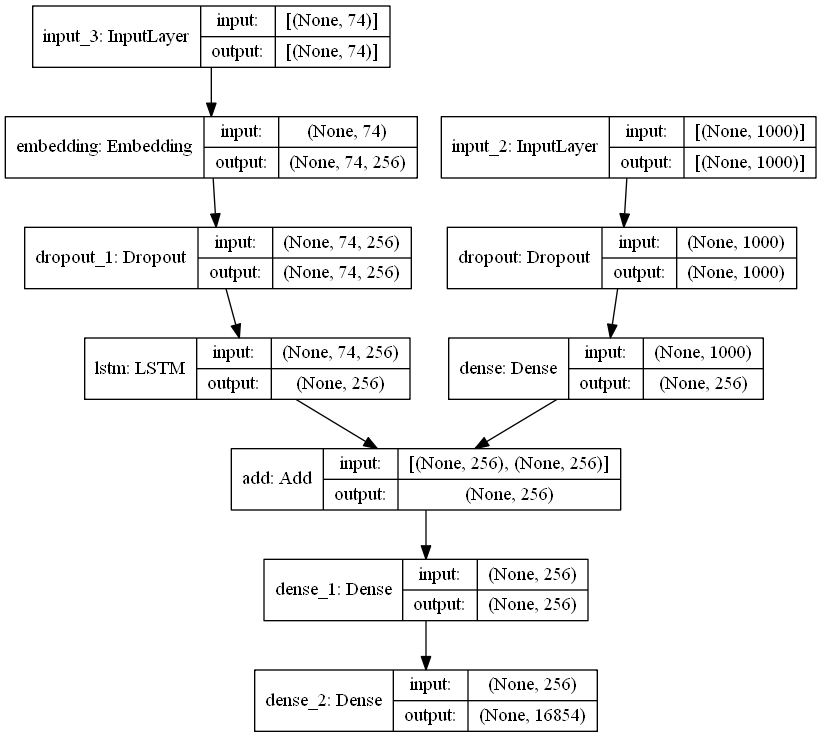

In [26]:
# Encoder model

# input as image features
inputs1 = Input(shape = (1000, )) # shape from model summ
fe1 = Dropout(0.5)(inputs1)
fe2 = Dense(256, activation = 'relu')(fe1)

# sequence feature layers
inputs2 = Input(shape = (max_len, ))
se1 = Embedding(vocabSize, 256, mask_zero = True)(inputs2)
se2 = Dropout(0.5)(se1) # can be < 0.5 but after experiment 0.5 is the best value to prevent overfitting
se3 = LSTM(256)(se2)

# Decoder model
decoder1 = add([fe2, se3]) # add the output of previous 2 layers together
decoder2 = Dense(256, activation = 'relu')(decoder1)
outputs = Dense(vocabSize, activation = 'softmax')(decoder2)

model = Model(inputs = [inputs1, inputs2], outputs = outputs)
model.compile(loss = 'categorical_crossentropy', optimizer ='adam')

# plot the model
plot_model(model, show_shapes = True)

In [30]:
# model training
# if no data gen, train quickly but use a lot of ram
epochs = 50
batch_size = 32
steps = len(train) // batch_size
for i in range(epochs): # loop through each epoch
    # compile data generator
    generator = dataGenerator(train, imgCaptionDict, imageFeatures, tokenizer, max_len, vocabSize, batch_size)
    model.fit(generator, epochs = 1, steps_per_epoch = steps, verbose = 1)

794/794 [==============================] - 616s 776ms/step - loss: 2.6544


In [31]:
# save the model
model.save(directory + '/50epoch16batch_model.h5')

C:\Users\mark8\anaconda3\envs\ev\lib\site-packages\keras\utils\generic_utils.py:494: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  warnings.warn('Custom mask layers require a config and must override '


In [32]:
# model = load_model(directory + '/50epoch16batch_model.h5')

## Generate caption for the image

In [33]:
def index2word(integer, tokenizer):
    for word, index in tokenizer.word_index.items():
        if index == integer:
            return word # if the index is equal to the integer that we have predicted from the model then return that word
    return None

In [34]:
def predict_caption(model, image, tokenizer, max_length):
    # start tag "startseq"
    in_text = 'startseq'
    for i in range(max_length):
        sequence = tokenizer.texts_to_sequences([in_text])[0]
        sequence = pad_sequences([sequence], max_length)
        yhat = model.predict([image, sequence], verbose = 0)
        yhat = np.argmax(yhat)

        word = index2word(yhat, tokenizer)
        
        if word is None:
            break

        in_text += ' ' + word
        
        # stop if reach "endseq"
        if word == 'endseq':
            break
    return in_text

In [35]:
actual, predicted = list(), list()

for key in tqdm(test):
    # actual caption
    captions = imgCaptionDict[key]
    # predicted caption
    y_pred = predict_caption(model, imageFeatures[key], tokenizer, max_len)
    correctCaptions = [caption.split() for caption in captions]
    y_pred = y_pred.split()
    actual.append(correctCaptions)
    predicted.append(y_pred)
    
# calculate BLEU score # use when dealing with text data
# The higher BLEU score is, the better.
print('BLEU-1 %f' % corpus_bleu(actual, predicted, weights= (1.0,0,0,0)))
print('BLEU-2 %f' % corpus_bleu(actual, predicted, weights= (0.5,0.5,0,0)))

  0%|          | 0/6357 [00:00<?, ?it/s]

BLEU-1 0.556200
BLEU-2 0.292231


## Visualizing the results

In [62]:
def predictCaption(image_name):
  # load the img
    # image_name = "104136873.jpg"
    imageID = image_name.split('.')[0] # splitting image name from the file extension
    imagePath = os.path.join(mainDirectory, image_name) # getting file path from the input
    image = Image.open(imagePath) # display the photo
    captions = imgCaptionDict[imageID]
    print('Actual:')
    for caption in captions:
        print(caption)
    # predict the caption
    y_pred = predict_caption(model, imageFeatures[imageID], tokenizer, max_len)
    print('Predicted:')
    print(y_pred)
    plt.imshow(image)

In [76]:
def predictCaptionVoice(image_name): # similar to the previous function but adding text-to-speech
  # load the img5733760
    imageID = image_name.split('.')[0]
    imagePath = os.path.join(mainDirectory, image_name)
    image = Image.open(imagePath)
    # predict the caption
    y_pred = predict_caption(model, imageFeatures[imageID], tokenizer, max_len)
    print('Predicted:')
    print(y_pred)
    # TTS
    text = y_pred
    var = gTTS(text, lang = 'en')
    var.save('text.mp3')
    playsound('text.mp3')
    os.remove('text.mp3')
    plt.imshow(image)

-----Predicted-----
startseq man in blue shirt is cooking in kitchen endseq


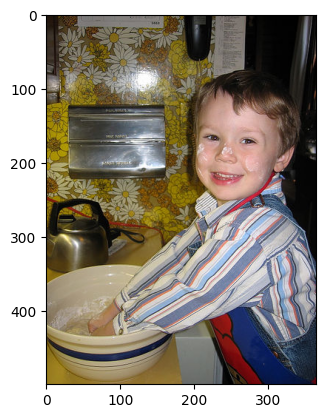

In [79]:
predictCaptionVoice("14264287.jpg")

-----Actual-----
startseq two soccer player one wearing white uniform and the other in red try to reach the soccer ball first endseq
startseq soccer player in red uniform go after the ball fending off player in white endseq
startseq two soccer player one in red the other in white racing towards soccer ball endseq
startseq two male soccer player on opposing team are trying to get the soccer ball endseq
startseq two football player chase after the ball endseq
-----Predicted-----
startseq two young boy are playing soccer endseq


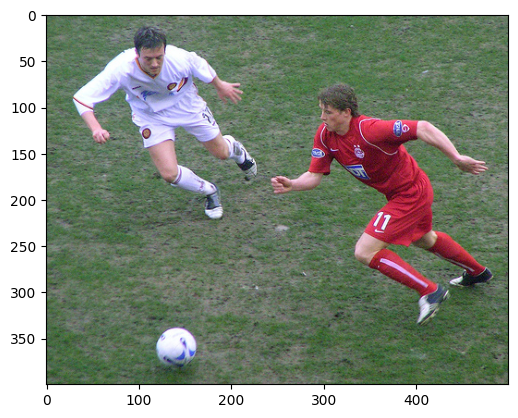

In [90]:
predictCaptionVoice("118647903.jpg")

-----Actual-----
startseq two dog are playing in grassy field one dog is biting the ear of the other dog endseq
startseq tan dog on grass with mouth open about to bite gray dog ear endseq
startseq two dog are playing together on green grass endseq
startseq brown dog biting gray dog ear endseq
startseq brown dog biting gray dog ear endseq
-----Predicted-----
startseq brown dog is running through the grass endseq


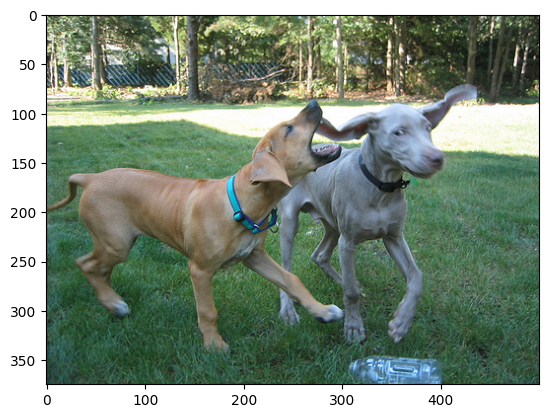

In [91]:
predictCaption("123889082.jpg")

-----Actual-----
startseq the man in the blue shirt wearing crucifix guard the entrance to the elevator with the aztec theme endseq
startseq man in blue shirt standing in front of garagelike structure painted with geometric design endseq
startseq an african american man with rosary around his neck is standing in room endseq
startseq man in blue shirt stand with his hand on his hip endseq
startseq man in blue shirt standing in front of doorway endseq
-----Predicted-----
startseq man in blue shirt is walking down the street endseq


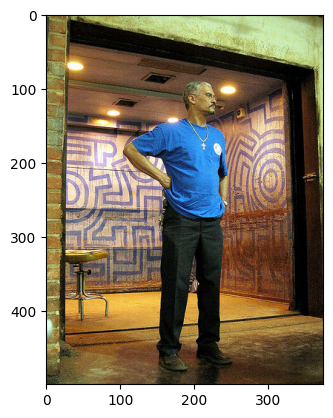

In [83]:
predictCaption("24467676.jpg")

-----Predicted-----
startseq man with beard and glass is sitting on bench endseq


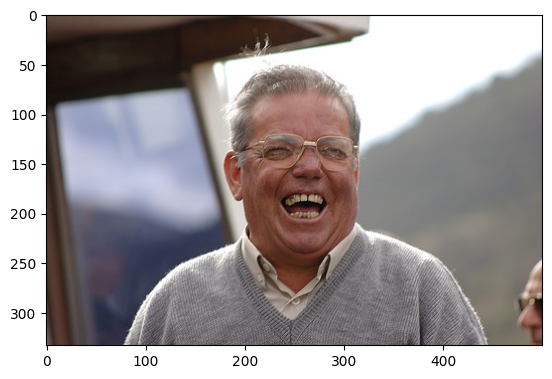

In [86]:
predictCaptionVoice('59303979.jpg')

-----Predicted-----
startseq man in black shirt is playing guitar endseq


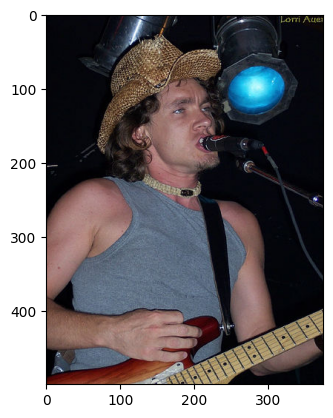

In [84]:
predictCaptionVoice('28041138.jpg')